In [1]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, mean_squared_error, r2_score
import seaborn as sns

DATA PREPARETION

In [2]:
# read the data
crovid_dataset = pd.read_csv("COVID19_line_list_data.csv")
df = pd.DataFrame(crovid_dataset)

# creating a new column: Wuhan_related
wuhan_related = [0] * len(df)
for i in range(len(df)):
    if df["visiting Wuhan"][i] == 1 or df["from Wuhan"][i] == 1:
        wuhan_related[i] = float(1)
    else:
        wuhan_related[i] = float(0)
df["Wuhan-related"] = wuhan_related
#print(df["Wuhan-related"])

# fix unreadable data

# for column "If_onset_approximated"
for i in range(len(df)):
    if df["If_onset_approximated"][i] == 0:
        df["If_onset_approximated"][i] = 1
    else:
        df["If_onset_approximated"][i] = 0

# for column "gender"
for i in range(len(df)):
    if df["gender"][i] == "male":
        df["gender"][i] = 1
    else:
        df["gender"][i] = 0

# for column "country"
counter = 0
value = df["country"][0]
for i in range(len(df)):
    if df["country"][i] == value:
        df["country"][i] = counter
    else:
        value = df["country"][i]
        counter += 1
        df["country"][i] = counter
        
# for column "death"
df["death"] = df["death"].apply(pd.to_numeric, errors="ignore")
for i in range(len(df)):
    if df["death"][i] != 0:
        df["death"][i] = 1
df["if symptom onset"] = df["If_onset_approximated"]

X = age, Wuhan-related y = if symptom onset

In [3]:
unwanted_column = ["id", 
                "case_in_country", 
                "reporting date", 
                "summary", 
                "symptom_onset", 
                "If_onset_approximated", 
                "hosp_visit_date",
                "exposure_start", 
                "exposure_end", 
                "visiting Wuhan", 
                "from Wuhan", 
                "death", 
                "recovered", 
                "symptom", 
                "location", 
                "source", 
                "link",
                "country", 
                "gender"]
                
# remove unwanted columns
data_set = df.drop(columns=unwanted_column)

# drop nan values
data_set = data_set.dropna()
print(data_set)

# creating a feature set and a label set
label_set = np.asarray(data_set["if symptom onset"])
feature_set = np.asarray(data_set.drop(columns=["if symptom onset"]))
#print("label_set:", label_set)
#print("feature_set:", feature_set)


age  Wuhan-related  if symptom onset
0     66.0            1.0               1.0
1     56.0            1.0               1.0
2     46.0            1.0               1.0
3     60.0            1.0               0.0
4     58.0            0.0               0.0
...    ...            ...               ...
1052  45.0            0.0               0.0
1079  24.0            0.0               0.0
1080  24.0            0.0               0.0
1081  35.0            0.0               0.0
1084  70.0            0.0               0.0

[843 rows x 3 columns]


number of symptomatic instances: 522
number of asymptomatic instances: 321


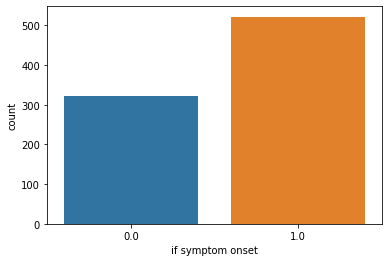

In [4]:
# visualization

# countplot
X = data_set.drop(columns=["if symptom onset"])
y = data_set["if symptom onset"]
ax = sns.countplot(y, label="Count")
symptom_onset, symptom_not_onset = data_set["if symptom onset"].value_counts()
print("number of symptomatic instances:", symptom_onset)
print("number of asymptomatic instances:", symptom_not_onset)


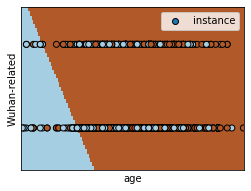

In [5]:
# meshgrid
h = 0.05
model = LogisticRegression(random_state=0, C=4)
model.fit(feature_set, label_set)
x_min, x_max = feature_set[:, 0].min() - 0.5, feature_set[:, 0].max() + 0.5
y_min, y_max = feature_set[:, 1].min() - 0.5, feature_set[:, 1].max() + 0.5
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
z = model.predict(np.c_[xx.ravel(), yy.ravel()])
z = z.reshape(xx.shape)
plt.figure(1, figsize=(4, 3))
plt.pcolormesh(xx, yy, z, cmap=plt.cm.Paired)
plt.scatter(feature_set[:, 0],
            feature_set[:, 1], 
            c=label_set, 
            edgecolors="k", 
            cmap=plt.cm.Paired, 
            label="instance")
plt.xlabel("age")
plt.ylabel("Wuhan-related")
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.legend()
plt.xticks(())
plt.yticks(())

plt.show()
# not working very well!!!

In [6]:
# split the data
X_train, X_test, y_train, y_test = train_test_split(feature_set, label_set, test_size=0.3, random_state=4)
model = LogisticRegression(random_state=0, C=4)

# fit the model
model.fit(X=X_train, y=y_train)

# return performance
y_predict = model.predict(X_test)
print("accuracy score: \n", accuracy_score(y_test, y_predict))
print("Coefficients: \n", model.coef_)
print("Intercept: \n", model.intercept_)
print("Mean squared error: \n%.2f"
      % mean_squared_error(y_test, y_predict))
print("Coefficient of determination: \n%.2f"
      % r2_score(y_test, y_predict))

accuracy score: 
 0.6442687747035574
Coefficients: 
 [[0.01617994 0.35888134]]
Intercept: 
 [-0.47454863]
Mean squared error: 
0.36
Coefficient of determination: 
-0.54


X = age, Wuhan-related y = death

In [7]:
unwanted_column = ["id", 
                "case_in_country", 
                "reporting date", 
                "summary", 
                "symptom_onset", 
                "If_onset_approximated", 
                "hosp_visit_date",
                "exposure_start", 
                "exposure_end", 
                "visiting Wuhan", 
                "from Wuhan", 
                "if symptom onset", 
                "recovered", 
                "symptom", 
                "location", 
                "source", 
                "link", 
                "country", 
                "gender"]
# drop unwanted columns
data_set = df.drop(columns=unwanted_column)

# drop nan
data_set = data_set.dropna()
print(data_set)

# creating a feature set and a label set
label_set = np.asarray(data_set["death"])
feature_set = np.asarray(data_set.drop(columns=['death']))
feature_set = feature_set.astype('int')
label_set = label_set.astype('int')

age death  Wuhan-related
0     66.0     0            1.0
1     56.0     0            1.0
2     46.0     0            1.0
3     60.0     0            1.0
4     58.0     0            0.0
...    ...   ...            ...
1052  45.0     0            0.0
1079  24.0     0            0.0
1080  24.0     0            0.0
1081  35.0     0            0.0
1084  70.0     0            0.0

[843 rows x 3 columns]


number of survival: 785
number of death: 58


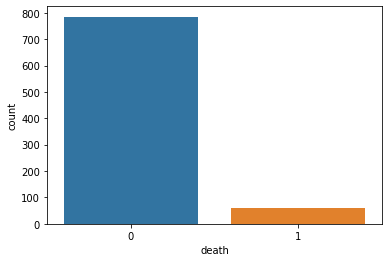

In [8]:
# count plot
X = data_set.drop(columns=["death"])
y = data_set["death"]
ax = sns.countplot(y, label="Count")
survival, death = data_set["death"].value_counts()
print("number of survival:", survival)
print("number of death:", death)

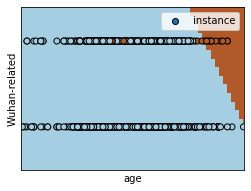

In [9]:
# meshgrid
h = 0.1
model = LogisticRegression(random_state=0, C=4)
model.fit(feature_set, label_set)
x_min, x_max = feature_set[:, 0].min() - 0.5, feature_set[:, 0].max() + 0.5
y_min, y_max = feature_set[:, 1].min() - 0.5, feature_set[:, 1].max() + 0.5
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
z = model.predict(np.c_[xx.ravel(), yy.ravel()])
z = z.reshape(xx.shape)
plt.figure(1, figsize=(4, 3))
plt.pcolormesh(xx, yy, z, cmap=plt.cm.Paired)
plt.scatter(feature_set[:, 0],
            feature_set[:, 1], 
            c=label_set, 
            edgecolors="k", 
            cmap=plt.cm.Paired, 
            label="instance")
plt.xlabel("age")
plt.ylabel("Wuhan-related")
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.legend()
plt.xticks(())
plt.yticks(())

plt.show()
# looks good

In [10]:
# split the data
X_train, X_test, y_train, y_test = train_test_split(feature_set, label_set, test_size=0.3, random_state=4)

# fit the model
model = LogisticRegression(random_state=0, C=5)
model.fit(X=X_train, y=y_train)
y_predict = model.predict(X_test)

# return performance
print("accuracy score: \n", accuracy_score(y_test, y_predict))
print("Coefficients: \n", model.coef_)
print("Intercept: \n", model.intercept_)
print("Mean squared error: \n%.2f"
      % mean_squared_error(y_test, y_predict))
print("Coefficient of determination: \n%.2f"
      % r2_score(y_test, y_predict))



accuracy score: 
 0.9604743083003953
Coefficients: 
 [[0.09223628 1.51531073]]
Intercept: 
 [-8.68735622]
Mean squared error: 
0.04
Coefficient of determination: 
0.24
